In [1]:
import os 
import scipy
import numpy as np
from matplotlib import pyplot as plt
from mne import io
from bids import BIDSLayout
from mne.decoding import TimeFrequency
from matplotlib import pyplot as plt
from scipy import stats, signal
import mne
from mne import create_info, EpochsArray
from mne.time_frequency import tfr_morlet
import pandas as pd

In [3]:
os.path.exists(PATH)

True

In [2]:
PATH = "C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\PD_ButtonPress\\sub-FOG006\\ses-postimp\\ieeg\\"

In [80]:
dat = io.read_raw_edf(os.path.join(PATH, "sub-FOG006_ses-postimp_task-restingSit_run-01_ieeg.edf"))

Extracting EDF parameters from C:\Users\ICN_admin\Dropbox (Brain Modulation Lab)\Shared Lab Folders\CRCNS\PD_ButtonPress\sub-FOG006\ses-postimp\ieeg\sub-FOG006_ses-postimp_task-restingSit_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [81]:
dat.ch_names

['POL RS1',
 'POL RS2',
 'POL RS3',
 'POL RS4',
 'POL RS5',
 'POL RS6',
 'POL RS7',
 'POL RS8',
 'POL LD1',
 'POL LD2',
 'POL RD1',
 'POL RD2',
 'POL RD3',
 'POL RD4',
 'POL LEMG1',
 'POL LEMG2',
 'POL REMG1',
 'POL REMG2',
 'POL E',
 'POL LD3',
 'POL LD4',
 'POL DC10',
 'POL DC11',
 'POL $LD3',
 'POL $LD4']

In [82]:
dat.get_data().shape

(25, 440513)

In [83]:
emg_l_1 = [idx for idx, ch in enumerate(dat.ch_names) if "POL LEMG1" in ch][0]
emg_l_2 = [idx for idx, ch in enumerate(dat.ch_names) if "POL LEMG2" in ch][0]
emg_r_1 = [idx for idx, ch in enumerate(dat.ch_names) if "POL REMG1" in ch][0]
emg_r_2 = [idx for idx, ch in enumerate(dat.ch_names) if "POL REMG2" in ch][0]

Text(0, 0.5, 'EMG signal')

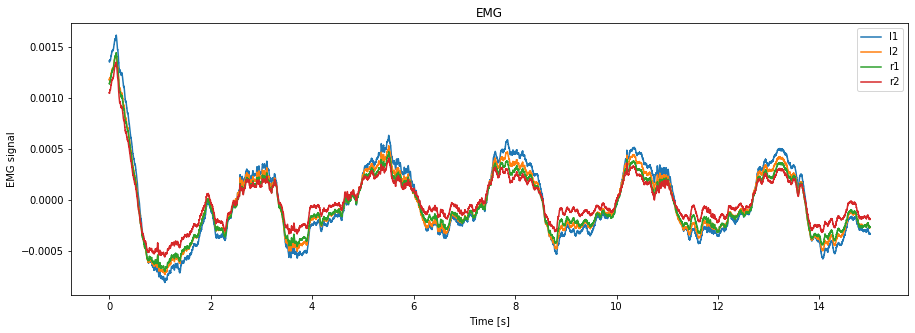

In [84]:
plt.figure(figsize=(15,5))
fs = 2000
x_time = np.arange(0, 30000, 1)*(1/fs)
plt.plot(x_time, dat.get_data()[emg_l_1, :30000], label="l1")
plt.plot(x_time, dat.get_data()[emg_l_2, :30000], label="l2")
plt.plot(x_time, dat.get_data()[emg_r_1, :30000], label="r1")
plt.plot(x_time, dat.get_data()[emg_r_2, :30000], label="r2")
plt.title("EMG")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("EMG signal")

In [85]:
ttl_idx = [idx for idx, ch in enumerate(dat.ch_names) if "POL DC10" in ch][0]

Text(0, 0.5, 'TTL signal')

C:\Users\ICN_admin\Anaconda3\lib\site-packages\IPython\core\events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\ICN_admin\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


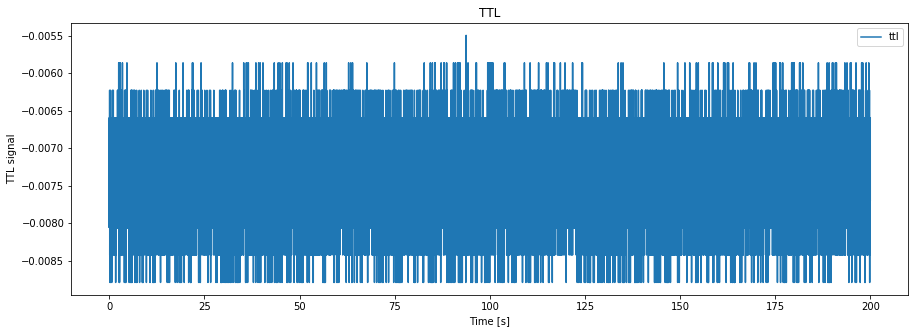

In [87]:
plt.figure(figsize=(15,5))
fs = 2000
time_start = 0
time_end = 400000
x_time = np.arange(time_start, time_end, 1)*(1/fs)
plt.plot(x_time, dat.get_data()[ttl_idx, time_start:time_end], label="ttl")
plt.title("TTL")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("TTL signal")

Text(0, 0.5, 'TTL signal')

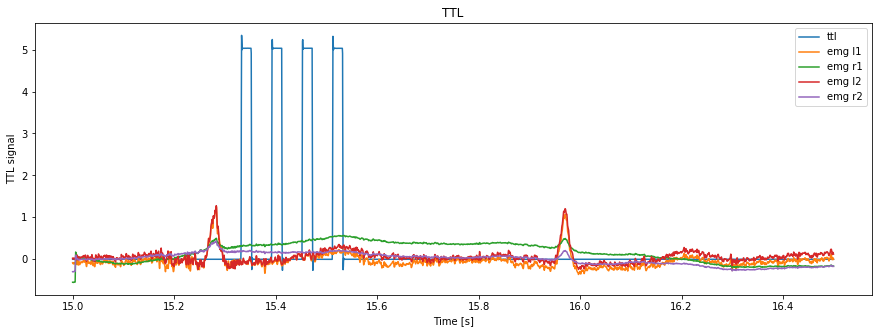

In [12]:
plt.figure(figsize=(15,5))
fs = 2000
time_start = 30000
time_end = 33000
x_time = np.arange(time_start, time_end, 1)*(1/fs)
plt.plot(x_time, dat.get_data()[ttl_idx, time_start:time_end], label="ttl")
plt.plot(x_time, 1000*dat.get_data()[emg_l_1, time_start:time_end], label="emg l1")
plt.plot(x_time, 1000*dat.get_data()[emg_r_1, time_start:time_end], label="emg r1")
plt.plot(x_time, 1000*dat.get_data()[emg_l_2, time_start:time_end], label="emg l2")
plt.plot(x_time, 1000*dat.get_data()[emg_r_2, time_start:time_end], label="emg r2")
plt.title("TTL")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("TTL signal")

In [13]:
# Movement button press when TTL is up, ECOG signals start with RS1 
idx_ecog = []
for i in range(6):
    idx_ecog.append([idx for idx, ch in enumerate(dat.ch_names) if "POL RS"+str(i+1) in ch][0])

Text(0, 0.5, 'ECOG signal')

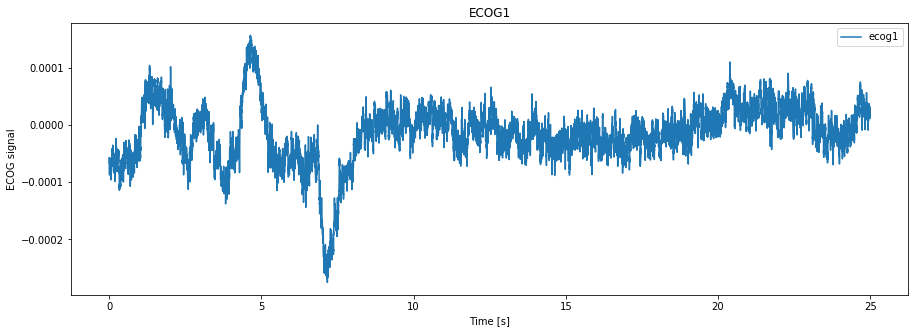

In [14]:
plt.figure(figsize=(15,5))
fs = 2000
time_start = 0
time_end = 50000
x_time = np.arange(time_start, time_end, 1)*(1/fs)
plt.plot(x_time, dat.get_data()[idx_ecog[0], time_start:time_end], label="ecog1")
plt.title("ECOG1")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("ECOG signal")

### estimate TF Plot TTL movement locked  

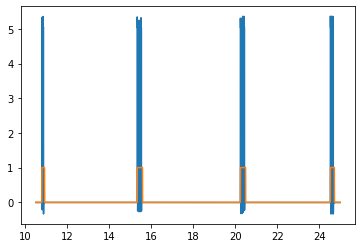

In [61]:
time_start = 21000
time_end = 50000
x_time = np.arange(time_start, time_end, 1)*(1/fs)
plt.plot(x_time, dat.get_data()[ttl_idx, time_start:time_end], label="ttl")
plt.plot(x_time, mov_bin[time_start:time_end], label="ttl binary")



In [16]:
# https://github.com/neuromodulation/icn/blob/master/icn_m1/t_f_BIDS.py

In [17]:
dat.get_data().shape[1]/(fs*60)

10.93415

In [7]:
def calc_epochs(bv_raw, y_tr, info, threshold, epoch_lim):
    ind_mov = np.where(np.diff(np.array(y_tr>threshold)*1) == 1)[0]
    low_limit = ind_mov>epoch_lim
    up_limit = ind_mov < y_tr.shape[0]-epoch_lim
    ind_mov = ind_mov[low_limit & up_limit]
    bv_epoch = np.zeros([ind_mov.shape[0], int(epoch_lim*2)])
    y_arr = np.zeros([ind_mov.shape[0],int(epoch_lim*2)])
    n_epochs = bv_epoch.shape[0]
    events = np.empty((n_epochs, 3), dtype=int)


    event_id = dict(mov_present=1)

    for idx, i in enumerate(ind_mov):
        #if i > 0 and (ind_mov[idx] - ind_mov[idx-1] > 1000): 
        # TTL signal is a rectangular signal with length ~500ms 
        bv_epoch[idx,:] = bv_raw[i-epoch_lim:i+epoch_lim]
        y_arr[idx,:] = y_tr[i-epoch_lim:i+epoch_lim]
        events[idx,:] = i, 0, event_id["mov_present"]
    print(bv_epoch.shape)
    bv_epoch = np.expand_dims(bv_epoch, axis=1)
    print(bv_epoch.shape)
    epochs = EpochsArray(data=bv_epoch, info=info, events=events, event_id=event_id)
    return epochs

In [8]:
def preprocess_mov(mov_dat):
    # the TIME OFF in the TTL signal is ~50 ms
    MOV_ON = False
    mov_new = np.zeros(mov_dat.shape[0])
    mov_new[0] = mov_dat[0]
    mov_on_set = 0
    for i in range(mov_dat.shape[0]):
        if i > 0 and mov_dat[i] > 1:
            MOV_ON = True
            mov_on_set = i 
        if (i - mov_on_set) > 100 and mov_dat[i] < 1: 
            mov_new[i] = 0
            MOV_ON = False
        if MOV_ON is True:
            mov_new[i] = 1
    return mov_new

### Run through all subjects

In [108]:
# Analyze STN and ECOG separately 
# check status_description in .tsv if good
# different naming conventions: "POL RS." for RIGHT Strip, then "POL RD" o "POL LD" for STN 
channel_df = pd.read_csv(os.path.join(PATH, patient_files[0])[:-5]+"_channels.tsv", sep="\t", encoding= 'unicode_escape')

In [111]:
channel_df["name"][0]

'POL RS1'

In [121]:
channel_df.iloc[channel_df[channel_df.name == channel_df["name"][0]].index[0]]["status"]

'good'

In [8]:
PATH = "C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\PD_ButtonPress\\"
patient_files = ["sub-FOG006\\ses-postimp\\ieeg\\sub-FOG006_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOG008\\ses-postimp\\ieeg\\sub-FOG008_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOG010\\ses-postimp\\ieeg\\sub-FOG010_ses-postimp_task-buttonPress_run-01_ieeg.edf", 
                 "sub-FOG011\\ses-postimp\\ieeg\\sub-FOG011_ses-postimp_task-buttonPress_run-01_ieeg.edf", 
                 "sub-FOG013\\ses-postimp\\ieeg\\sub-FOG013_ses-postimp_task-buttonPress_run-01_ieeg.edf", 
                 "sub-FOGC001\\ses-postimp\\ieeg\\sub-FOGC001_ses-postimp_task-buttonPress_run-01_ieeg.edf"]
subjects = ["FOG006", "FOG008", "FOG010", "FOG011", "FOG013", "FOGC001"]

def write_TF(Name_begin, patient_f, patient_idx):
    channel_df = pd.read_csv(os.path.join(PATH, patient_f)[:-9]+"_channels.tsv", sep="\t", 
                                 encoding= 'unicode_escape')

    dat = io.read_raw_edf(os.path.join(PATH, patient_f))
    ttl_idx = [idx for idx, ch in enumerate(dat.ch_names) if "POL DC10" in ch][0]
    mov_bin = preprocess_mov(dat.get_data()[ttl_idx,:])

    idx_ecog = []
    for ch in channel_df["name"]:
        if ch.startswith(Name_begin) is False or \
                channel_df.iloc[channel_df[channel_df.name == ch].index[0]]["status"] != "good":
            continue
        idx_ecog = [idx for idx, ch_ in enumerate(dat.ch_names) if ch_ == ch][0]
        info = create_info(ch_names=[ch[4:]], sfreq=2000, ch_types='ecog')
        epochs = calc_epochs(dat.get_data()[idx_ecog,:], mov_bin, info, threshold=0.5, epoch_lim=2500*2)
        freqs = np.arange(7, 200, 1)
        power = tfr_morlet(epochs, freqs=freqs,
                               n_cycles=5, return_itc=False, zero_mean=True, picks=0)
        dat_ = power.data[0,:,1000:9000]  # cut off borders due to Wavelet transform; 500ms till 4s post movement
        dat_z = stats.zscore(dat_, axis=1)
        plt.imshow(dat_z, aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
        cbar = plt.colorbar()
        cbar.set_label('Normalized spectral power [VAR]')
        plt.clim(-1.5,1.5)
        plt.gca().invert_yaxis()
        plt.title(ch[4:] + " " + subjects[patient_idx])
        plt.show()
        np.save('C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\PD_ButtonPress\\derivatives\\'+
                        "sub_"+subjects[patient_idx] +"_ch_"+ch[4:]+'.npy', dat_z)

Extracting EDF parameters from C:\Users\ICN_admin\Dropbox (Brain Modulation Lab)\Shared Lab Folders\CRCNS\PD_ButtonPress\sub-FOG006\ses-postimp\ieeg\sub-FOG006_ses-postimp_task-buttonPress_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


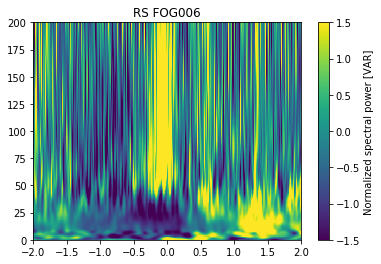

(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


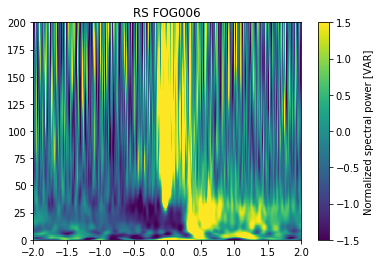

(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


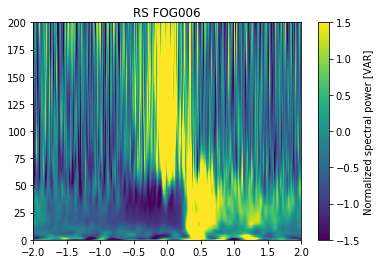

(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


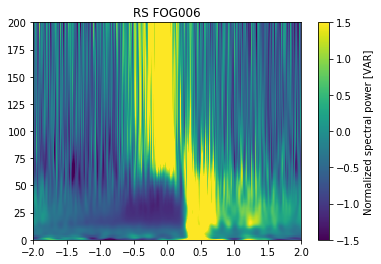

(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


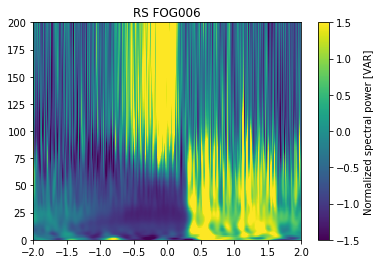

(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


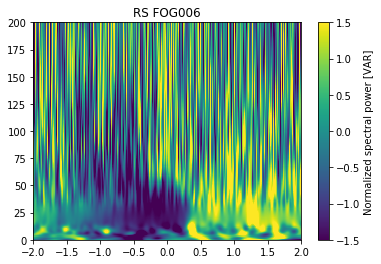

(155, 10000)
(155, 1, 10000)
155 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


KeyboardInterrupt: 

In [9]:
args = []
for Name_begin in ["POL RS", "POL LD", "POL RD"]:
    for patient_idx, patient_f in enumerate(patient_files):
        args.append([Name_begin, patient_f, patient_idx])
        write_TF(Name_begin, patient_f, patient_idx)

In [131]:
import multiprocessing

In [ ]:
NUM_PROCESSES = 30
pool = multiprocessing.Pool(NUM_PROCESSES)
pool.starmap(write_TF, args)

### Plots

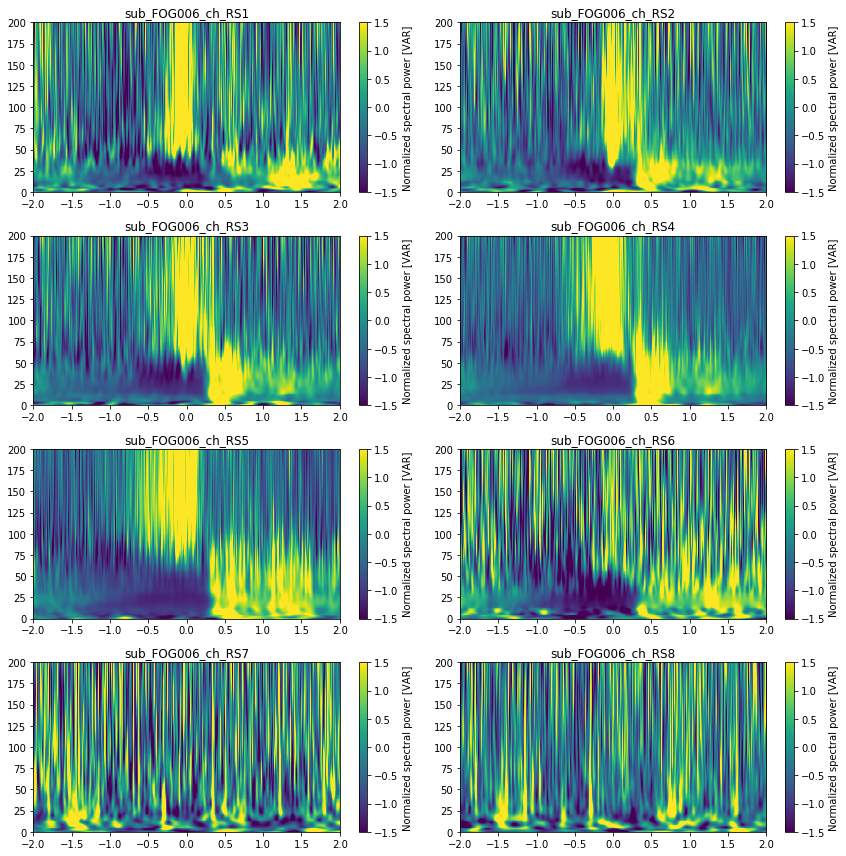

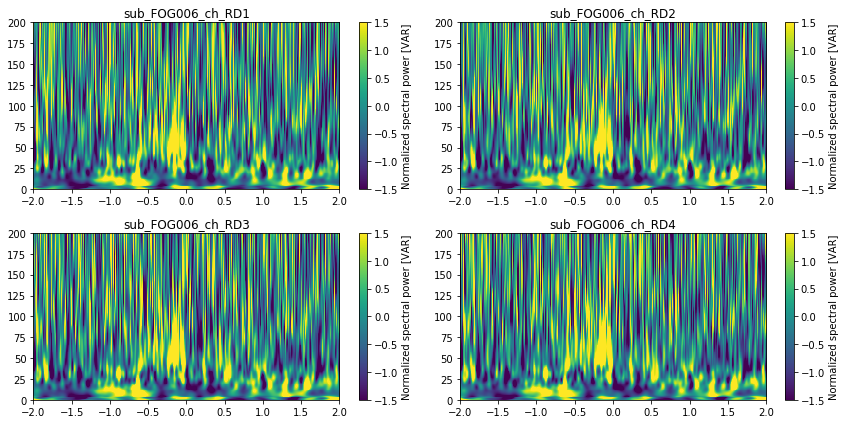

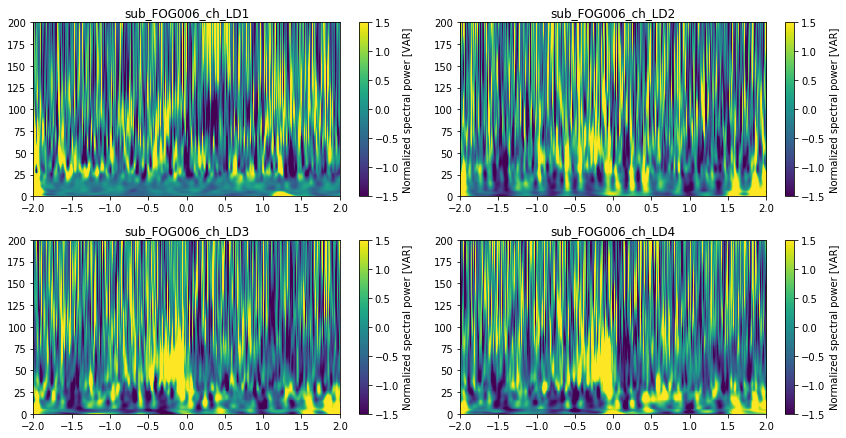

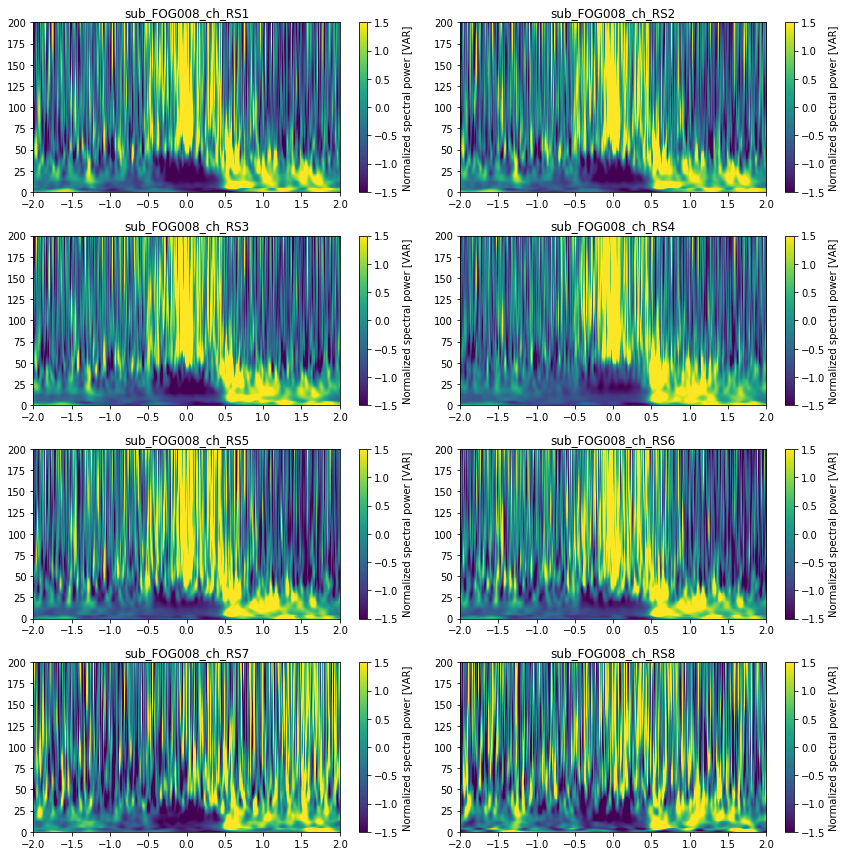

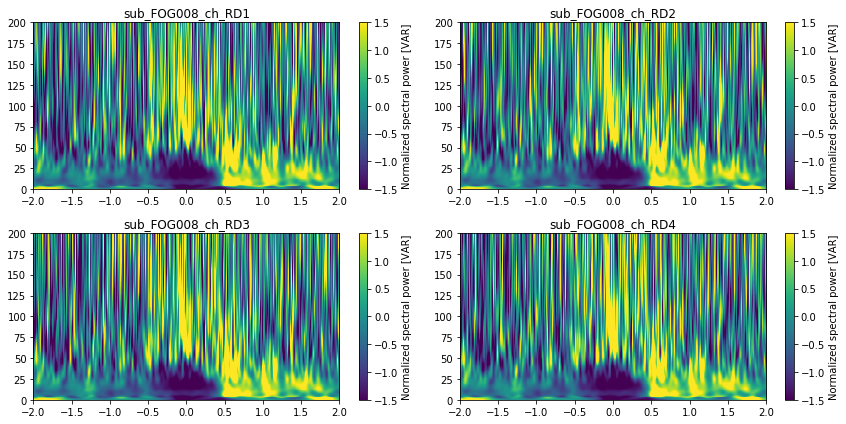

...

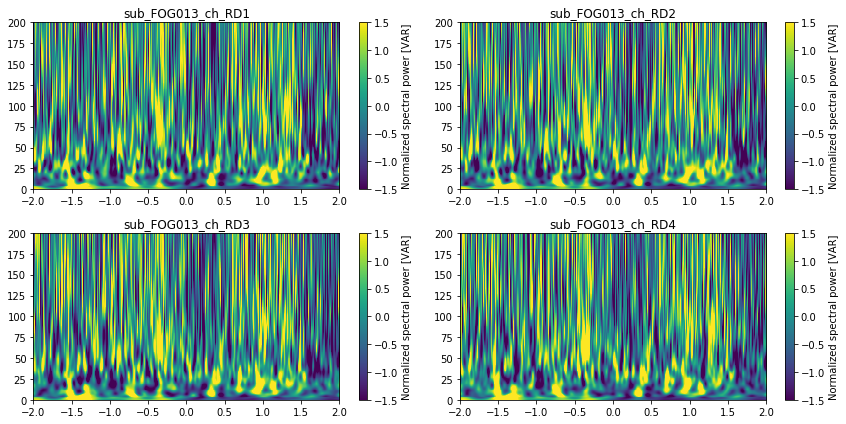

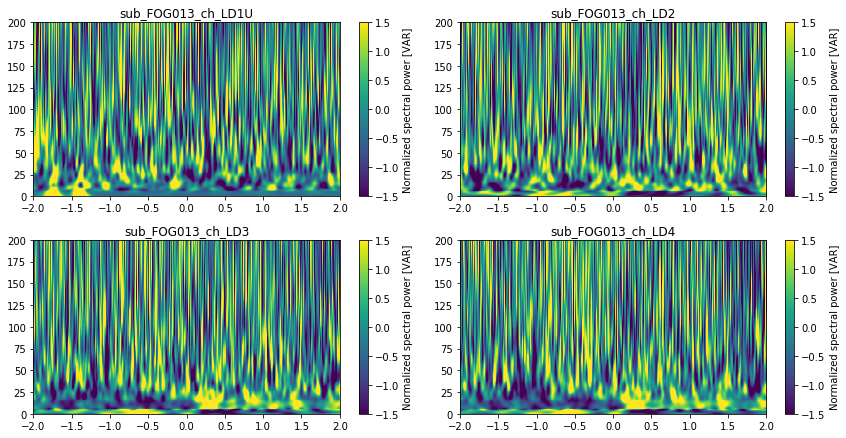

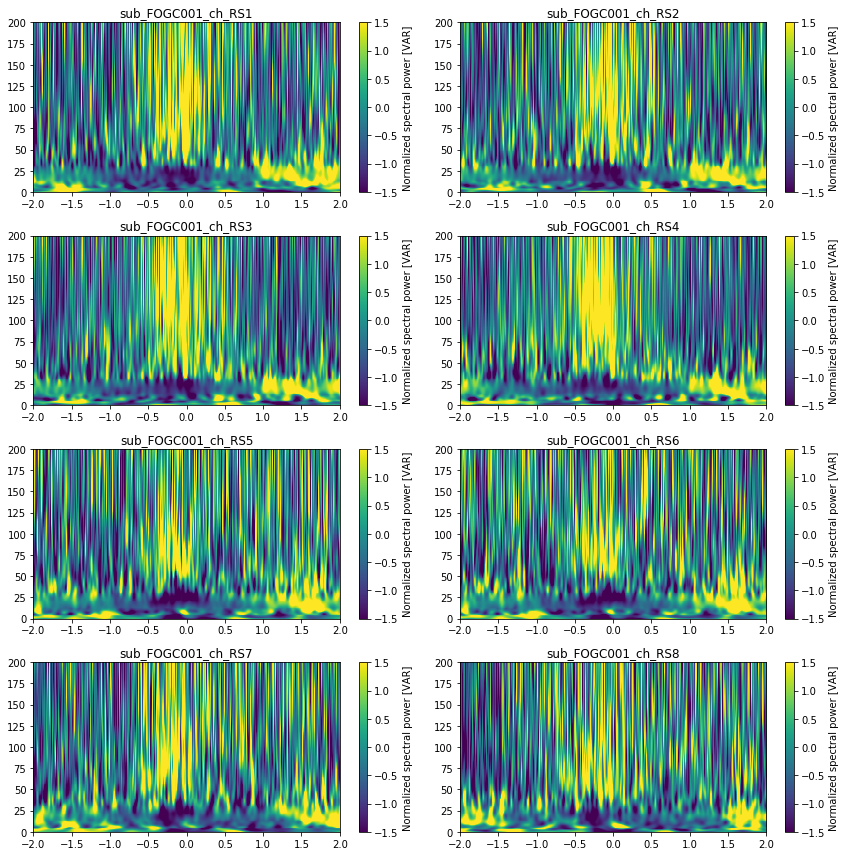

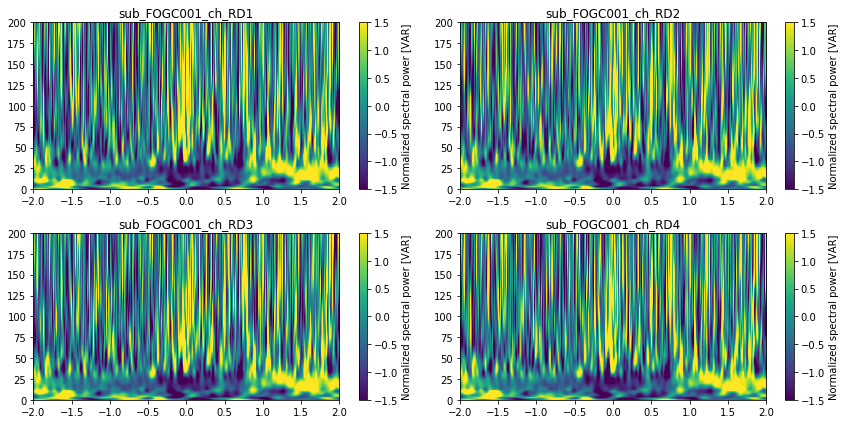

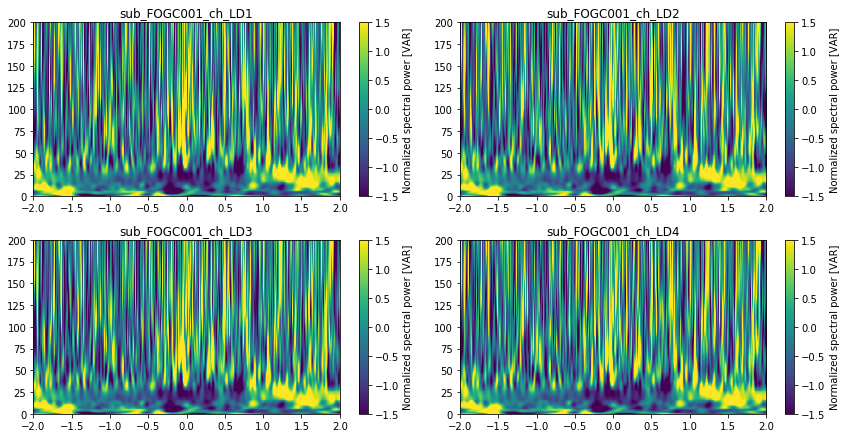

In [37]:
PATH_TF = "C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\PD_ButtonPress\\derivatives\\"
subscripts = ["RS", "RD", "LD"]
for subject in subjects:
    if subject == "FOG011":
        continue
    for subscript in subscripts:
        if subscript == "RD" or subject == "LD":
            plt.figure(figsize=(12, 6))
        else:
            plt.figure(figsize=(12, 12))
        
        files_ = [f for f in os.listdir(PATH_TF) if subscript in f and subject in f]
        for idx, f in enumerate(files_):
            dat_z = np.load(os.path.join(PATH_TF, f))
            if subscript == "RD" or subject == "LD":
                plt.subplot(2,2,idx+1)
            else:
                plt.subplot(4,2, idx+1)
            plt.imshow(dat_z, aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
            cbar = plt.colorbar()
            cbar.set_label('Normalized spectral power [VAR]')
            plt.clim(-1.5,1.5)
            plt.gca().invert_yaxis()
            plt.title(f[:-4])
        plt.tight_layout()
        plt.show()

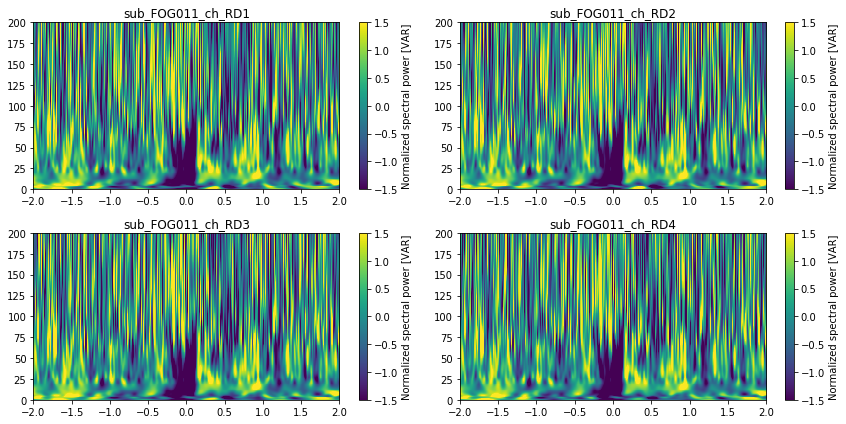

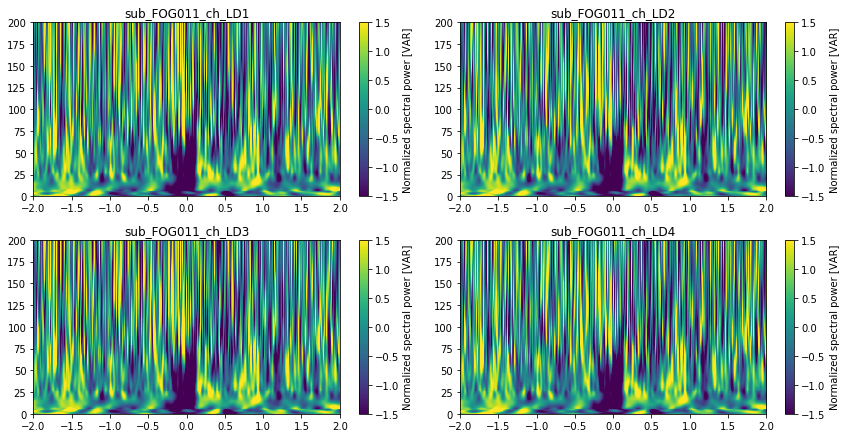

In [21]:
subject = "FOG011"
subscripts_here = ["RD", "LD"]
for subscript in subscripts_here:
    if subscript == "RD" or subject == "LD":
        plt.figure(figsize=(12, 6))
    else:
        plt.figure(figsize=(12, 12))

    files_ = [f for f in os.listdir(PATH_TF) if subscript in f and subject in f]
    for idx, f in enumerate(files_):
        dat_z = np.load(os.path.join(PATH_TF, f))
        if subscript == "RD" or subject == "LD":
            plt.subplot(2,2,idx+1)
        else:
            plt.subplot(4,2, idx+1)
        plt.imshow(dat_z, aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
        cbar = plt.colorbar()
        cbar.set_label('Normalized spectral power [VAR]')
        plt.clim(-1.5,1.5)
        plt.gca().invert_yaxis()
        plt.title(f[:-4])
    plt.tight_layout()
    plt.show()

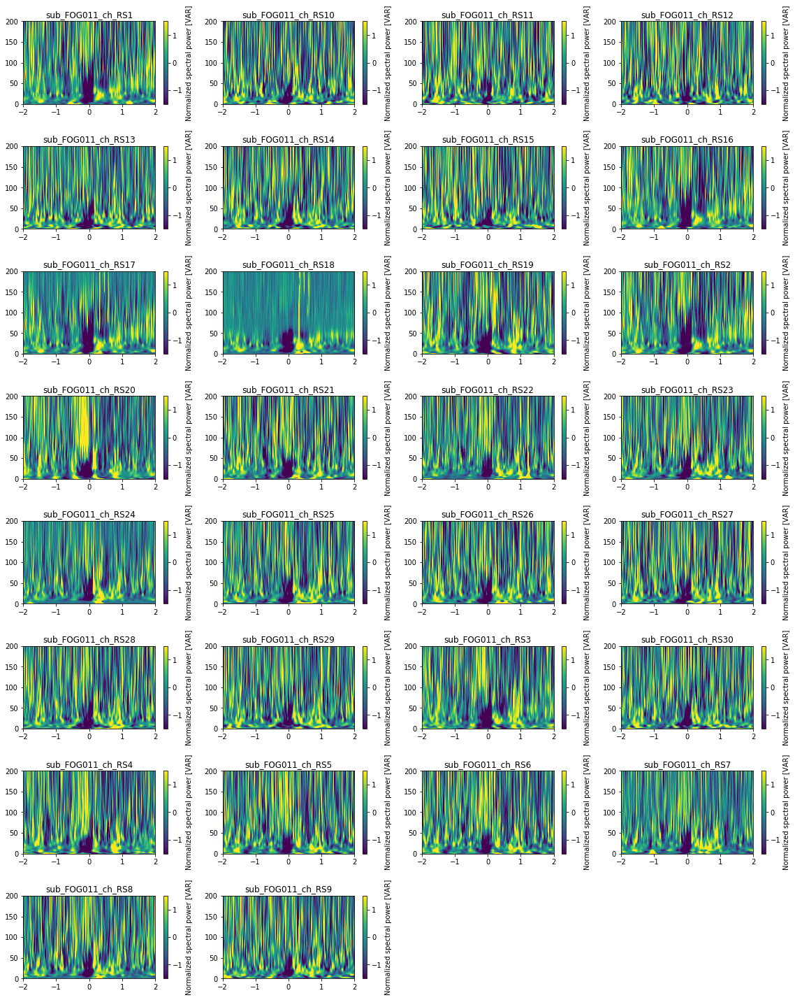

In [39]:
subject = "FOG011"
subscripts_here = ["RS"]
for subscript in subscripts_here:
    plt.figure(figsize=(16, 20))

    files_ = [f for f in os.listdir(PATH_TF) if subscript in f and subject in f]
    for idx, f in enumerate(files_):
        dat_z = np.load(os.path.join(PATH_TF, f))
        
        plt.subplot(8,4, idx+1)
        plt.imshow(dat_z, aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
        cbar = plt.colorbar()
        cbar.set_label('Normalized spectral power [VAR]')
        plt.clim(-1.5,1.5)
        plt.gca().invert_yaxis()
        plt.title(f[:-4])
    plt.tight_layout()
    plt.show()

### MEAN ECOG and STN plots

In [40]:
subscript = "RS"
files_ = [f for f in os.listdir(PATH_TF) if subscript in f]
dat_z_RS = []
for idx, f in enumerate(files_):
    dat_z_RS.append(np.load(os.path.join(PATH_TF, f)))
subscript = "LD"
files_ = [f for f in os.listdir(PATH_TF) if subscript in f]
dat_z_LD = []
for idx, f in enumerate(files_):
    dat_z_LD.append(np.load(os.path.join(PATH_TF, f)))   
subscript = "RD"
files_ = [f for f in os.listdir(PATH_TF) if subscript in f]
dat_z_RD = []
for idx, f in enumerate(files_):
    dat_z_RD.append(np.load(os.path.join(PATH_TF, f)))   


(66, 193, 8000)

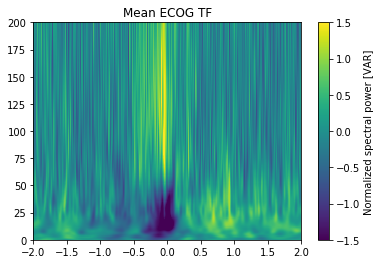

In [43]:
plt.imshow(np.array(dat_z_RS).mean(axis=0), aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
cbar = plt.colorbar()
cbar.set_label('Normalized spectral power [VAR]')
plt.clim(-1.5,1.5)
plt.gca().invert_yaxis()
plt.title("Mean ECOG TF")
plt.show()

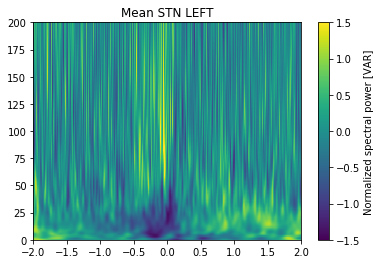

In [46]:
plt.imshow(np.array(dat_z_LD).mean(axis=0), aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
cbar = plt.colorbar()
cbar.set_label('Normalized spectral power [VAR]')
plt.clim(-1.5,1.5)
plt.gca().invert_yaxis()
plt.title("Mean STN LEFT")
plt.show()

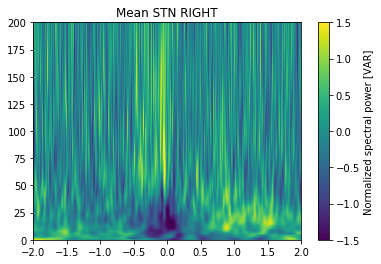

In [47]:
plt.imshow(np.array(dat_z_RD).mean(axis=0), aspect='auto', extent=[-2,2,200,0])#, cmap='hot')
cbar = plt.colorbar()
cbar.set_label('Normalized spectral power [VAR]')
plt.clim(-1.5,1.5)
plt.gca().invert_yaxis()
plt.title("Mean STN RIGHT")
plt.show()

### DEBUG

In [4]:
PATH = "C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\PD_ButtonPress\\"
patient_files = ["sub-FOG006\\ses-postimp\\ieeg\\sub-FOG006_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOG008\\ses-postimp\\ieeg\\sub-FOG008_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOG010\\ses-postimp\\ieeg\\sub-FOG010_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOG011\\ses-postimp\\ieeg\\sub-FOG011_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOG013\\ses-postimp\\ieeg\\sub-FOG013_ses-postimp_task-buttonPress_run-01_ieeg.edf",
                 "sub-FOGC001\\ses-postimp\\ieeg\\sub-FOGC001_ses-postimp_task-buttonPress_run-01_ieeg.edf"]
subjects = ["FOG006", "FOG008", "FOG010", "FOG011", "FOG013", "FOGC001"]

In [28]:
Name_begin = "POL LD"
patient_f = patient_files[4]
patient_idx = 4

In [29]:
channel_df = pd.read_csv(os.path.join(PATH, patient_f)[:-9]+"_channels.tsv", sep="\t",
                                 encoding= 'unicode_escape')

dat = io.read_raw_edf(os.path.join(PATH, patient_f))
ttl_idx = [idx for idx, ch in enumerate(dat.ch_names) if "POL DC10" in ch][0]
mov_bin = preprocess_mov(dat.get_data()[ttl_idx,:])

idx_ecog = []

Extracting EDF parameters from C:\Users\ICN_admin\Dropbox (Brain Modulation Lab)\Shared Lab Folders\CRCNS\PD_ButtonPress\sub-FOG013\ses-postimp\ieeg\sub-FOG013_ses-postimp_task-buttonPress_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [30]:
channel_df

,name,type,units,low_cutoff,high_cutoff,reference,group,sampling_frequency,description,notch,status,status_description
0,POL LD1U,LFP,¦ÌV,600.0,0.08,LD1,LD,2000.0,DBS depth,NaN,good,POL LD1U and POL LD1D are actually the same co...
1,POL LD1D,LFP,¦ÌV,600.0,0.08,LD1,LD,2000.0,DBS depth,NaN,good,NaN
2,POL LD2,LFP,¦ÌV,600.0,0.08,LD1,LD,2000.0,DBS depth,NaN,good,NaN
3,POL LD3,LFP,¦ÌV,600.0,0.08,LD1,LD,2000.0,DBS depth,NaN,good,NaN
4,POL LD4,LFP,¦ÌV,600.0,0.08,LD1,LD,2000.0,DBS depth,NaN,good,NaN
5,POL RD3,LFP,¦ÌV,600.0,0.08,LD1,RD,2000.0,DBS depth,NaN,good,NaN
6,POL RD4,LFP,¦ÌV,600.0,0.08,LD1,RD,2000.0,DBS depth,NaN,good,NaN
7,POL RS1,ECoG,¦ÌV,600.0,0.08,LD1,RS,2000.0,Subdural strip,NaN,good,NaN
8,POL RS2,ECoG,¦ÌV,600.0,0.08,LD1,RS,2000.0,Subdural strip,NaN,good,NaN
9,POL RS3,ECoG,¦ÌV,600.0,0.08,LD1,RS,2000.0,Subdural strip,NaN,good,NaN


In [36]:
for ch in channel_df["name"]:
    if ch == 'POL LD1D ':
        continue
    PATH_save = 'C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\PD_ButtonPress\\derivatives\\'+\
                    "sub_"+subjects[patient_idx] +"_ch_"+ch[4:]+'.npy'
    if os.path.exists(PATH_save) is True:
        continue
    if ch.startswith(Name_begin) is False or \
            channel_df.iloc[channel_df[channel_df.name == ch].index[0]]["status"] != "good":
        continue
    print("used")
    print(PATH_save)
    idx_ecog = [idx for idx, ch_ in enumerate(dat.ch_names) if ch_ == ch][0]
    print(idx_ecog)
    info = create_info(ch_names=[ch[4:]], sfreq=2000, ch_types='ecog')
    epochs = calc_epochs(dat.get_data()[idx_ecog,:], mov_bin, info, threshold=0.5, epoch_lim=2500*2)
    freqs = np.arange(7, 200, 1)
    power = tfr_morlet(epochs, freqs=freqs,
                               n_cycles=5, return_itc=False, zero_mean=True, picks=0)
    dat_ = power.data[0,:,1000:9000]  # cut off borders due to Wavelet transform; 500ms till 4s post movement
    dat_z = stats.zscore(dat_, axis=1)
    np.save(PATH_save, dat_z)

used
C:\Users\ICN_admin\Dropbox (Brain Modulation Lab)\Shared Lab Folders\CRCNS\PD_ButtonPress\derivatives\sub_FOG013_ch_LD2.npy
2
(82, 10000)
(82, 1, 10000)
82 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
used
C:\Users\ICN_admin\Dropbox (Brain Modulation Lab)\Shared Lab Folders\CRCNS\PD_ButtonPress\derivatives\sub_FOG013_ch_LD3.npy
3
(82, 10000)
(82, 1, 10000)
82 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
used
C:\Users\ICN_admin\Dropbox (Brain Modulation Lab)\Shared Lab Folders\CRCNS\PD_ButtonPress\derivatives\sub_FOG013_ch_LD4.npy
4
(82, 10000)
(82, 1, 10000)
82 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [35]:
ch

'POL LD1D '

In [24]:
ch.startswith(dat.ch_names[0])

False

In [26]:
ch = "POL LD2"

In [18]:
ch.endswith(dat.ch_names[0])

False

In [27]:
[idx for idx, ch_ in enumerate(dat.ch_names) if ch_.startswith(ch)]

[2]

In [15]:
dat.ch_names

['POL LD1U',
 'POL LD1D',
 'POL LD2',
 'POL LD3',
 'POL LD4',
 'POL RD3',
 'POL RD4',
 'POL RS1',
 'POL RS2',
 'POL RS3',
 'POL RS4',
 'POL RS5',
 'POL RS6',
 'POL RS7',
 'POL E',
 'POL RS8',
 'POL LEMG1',
 'POL RD1',
 'POL RD2',
 'POL LEMG2',
 'POL REMG1',
 'POL REMG2',
 'POL DC10',
 'POL DC11',
 'POL $RD1',
 'POL $RD2']